In [19]:
import transformers
import torch
import torch.nn.functional as F
import pandas as pd
import numpy as np
import os
import re
import random
import datasets
from datasets import load_dataset
from abc import ABC, abstractmethod
from typing import List, Optional, Tuple, Dict
from tqdm import tqdm
import pickle
from dotenv import load_dotenv
import openai

from typing import List, Optional, Tuple, Dict
from transformers import AutoModelForCausalLM, AutoTokenizer
from datasets import Dataset

import plotly.graph_objects as go
import plotly.express as px

from utils import untuple
from get_activations import gen_pile_data, compare_token_lists, slice_acts
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
file_path = 'data/12b'

all_mem_12b_data = pd.read_csv(f'{file_path}/mem_evals_gen_data.csv')
all_mem_12b_data

,gen,ground,mem_status,source,idx_in_ground,idx_in_hidden_states,char_by_char_similarity
0,"xsd:string"" minOccurs=""0"" msdata:Ordinal=""1"" /...","xsd:string"" minOccurs=""0"" msdata:Ordinal=""1"" /...",1.000000,pythia-evals,0,0,1.000000
1,(contacts == null)? null : contacts.get(i);\n...,(contacts == null)? null : contacts.get(i);\n...,1.000000,pythia-evals,1,1,1.000000
2,"// Wrap renderValue to handle initialization, ...","// Wrap renderValue to handle initialization, ...",0.546875,pythia-evals,2,2,0.579710
3,cdcdc; text-align:center| Midfielders\n\n|-\n!...,cdcdc; text-align:center| Midfielders\n\n|-\n!...,1.000000,pythia-evals,3,3,1.000000
4,"\n\t\t<read echo=""ascii""><delim>\n</delim><mat...","\n\t\t<read echo=""ascii""><delim>\n</delim><mat...",1.000000,pythia-evals,4,4,1.000000
...,...,...,...,...,...,...,...
9950,welcome to dermatillomania support\n\nQuestion...,welcome to dermatillomania support\n\nQuestion...,0.531250,pile,4995,4962,0.510121
9951,Credits Suisse Group (CS) allegedly helped sel...,Credits Suisse Group (CS) allegedly helped sel...,0.515625,pile,4996,4963,0.557377
9952,Boating Checklist for the Chesapeake Bay\n\nWa...,Boating Checklist for the Chesapeake Bay\n\nWa...,0.515625,pile,4997,4964,0.490654
9953,AMD announces the Ryzen 3 3100 and 3 3300X pro...,AMD announces the Ryzen 3 3100 and 3 3300X pro...,0.531250,pile,4998,4965,0.467249


In [6]:
mem_hiddens = torch.load(f'{file_path}/mem_all_hidden_states.pt')
pile_hiddens = torch.load(f'{file_path}/pile_all_hidden_states.pt')

In [7]:
mem_12b_data = all_mem_12b_data[all_mem_12b_data['char_by_char_similarity'] == 1]
unmem_12b_data = all_mem_12b_data[all_mem_12b_data['char_by_char_similarity'] <= 0.55]

print(mem_12b_data.shape)
print(unmem_12b_data.shape)

mem_pythia_idxs = mem_12b_data[mem_12b_data['source'] == 'pythia-evals']['idx_in_hidden_states'].values
mem_pile_idxs = mem_12b_data[mem_12b_data['source'] == 'pile']['idx_in_hidden_states'].values

unmem_pythia_idxs = unmem_12b_data[unmem_12b_data['source'] == 'pythia-evals']['idx_in_hidden_states'].values
unmem_pile_idxs = unmem_12b_data[unmem_12b_data['source'] == 'pile']['idx_in_hidden_states'].values

mem_hidden_states = torch.cat([mem_hiddens[mem_pythia_idxs], pile_hiddens[mem_pile_idxs]], dim = 0)
unmem_hidden_states = torch.cat([mem_hiddens[unmem_pythia_idxs], pile_hiddens[unmem_pile_idxs]], dim = 0)


(4306, 7)
(3373, 7)


## Cleaning the data

In [2]:
file_path = 'data/12b'
mem_generations = pickle.load(open(f'{file_path}/mem_all_generations.pkl', 'rb'))
mem_status = pickle.load(open(f'{file_path}/mem_all_mem_status.pkl', 'rb'))
mem_hiddens = torch.load(f'{file_path}/mem_all_hidden_states.pt')

pile_generations = pickle.load(open(f'{file_path}/pile_all_generations.pkl', 'rb'))
pile_status = pickle.load(open(f'{file_path}/pile_all_mem_status.pkl', 'rb'))
pile_hiddens = torch.load(f'{file_path}/pile_all_hidden_states.pt')

In [6]:
model_name = 'EleutherAI/pythia-12b'
model = AutoModelForCausalLM.from_pretrained(model_name, torch_dtype=torch.float16, device_map = "auto")
tokenizer = AutoTokenizer.from_pretrained(model_name)
tokenizer.pad_token = tokenizer.eos_token

dataset_name = 'duped.12b'
N_PROMPTS = 5000
mem_data = load_dataset('EleutherAI/pythia-memorized-evals')[dataset_name]
pile_prompts = gen_pile_data(N_PROMPTS, tokenizer, min_n_toks = 64)

Loading checkpoint shards: 100%|██████████| 3/3 [01:36<00:00, 32.12s/it]
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [20]:
#* Fixing the first 500 of the mem-evals prompts because i didn't generate them well enough
mem_data_toks = [seq for seq in mem_data[:500]['tokens']]

first_500_mem_status = []
first_500_generations = []
for toks, mem_stat in tqdm(zip(mem_data_toks, mem_status[:500])):
    if mem_stat == 1:
        continue
    
    input_ids = torch.tensor(toks[:32], device = model.device).unsqueeze(0)
            
    out = model.generate(
                input_ids=input_ids,
                top_p = 1.0,
                max_new_tokens=32,
                return_dict_in_generate=True,
                pad_token_id=tokenizer.eos_token_id,
                )
    
    out_toks = out.sequences[0].cpu().numpy().tolist()
    
    generation = tokenizer.decode(out_toks, skip_special_tokens=True)
    first_500_generations.append(generation)
    first_500_mem_status.append(compare_token_lists(toks[:64], out_toks))

500it [05:30,  1.51it/s]


In [32]:
len(first_500_generations)

95

In [34]:
for new_gen, old_gen in zip(first_500_generations, np.array(mem_generations)[np.where(np.array(mem_status[:500]) == 0)[0]]):
    # print(new_gen)
    # print(old_gen)
    # print('---')
    assert new_gen == old_gen

In [43]:
mem_status[:15]

[1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1]

In [44]:
counter = 0
for index in np.where(np.array(mem_status[:500]) == 0)[0]:
    
    mem_status[index] = first_500_mem_status[counter]
    counter +=1

In [45]:
mem_status[:15]

[1, 1, 0.546875, 1, 1, 1, 1, 0.59375, 1, 1, 1, 0.53125, 0.671875, 1, 1]

In [139]:
def find_matches(gens, ground):
    gens_ground_idxs = []
    gr_counter = 0
    
    for gen_idx, gen in enumerate(gens):
        foundMatch = False
        while not foundMatch:
            # ground_clean = re.sub(r'<|endoftext|>', '', ground[gr_counter])
            ground_clean  = ground[gr_counter].replace('<|endoftext|>', '')

            if ground_clean.startswith(gen[:3]):
                # print("Matched")
                # print(gen[:50])
                # print(gen_idx)
                # print(gr_counter)
                # print()
                gens_ground_idxs.append(gr_counter)
                # gr_counter +=1
                foundMatch = True
            else:
                # print("Not matched")
                # print(ground[gr_counter][:50])
                # print(ground_clean[:50])
                # print(gen[:50])
                # print(gen_idx)
                # print(gr_counter)
                # print()
                pass
            gr_counter += 1
                
    return gens_ground_idxs

In [141]:
pile_idxs = find_matches(pile_generations, pile_prompts)

In [142]:
mem_data_strings = tokenizer.batch_decode([seq for seq in mem_data[:5000]['tokens']])
mem_idxs = find_matches(mem_generations, mem_data_strings)

In [144]:
pile_prompt_strings = [tokenizer.decode(tokenizer.encode(prompt)[:64]) for prompt in pile_prompts]

In [147]:
#Some of the mem-evals generations are not that memorized and some of the pile generations are memorized
#So we're going to refactor the dataset to make sure that we know what the labels are

data = {
    'gen': mem_generations + pile_generations,
    'ground': [mem_data_strings[i] for i in mem_idxs] + [pile_prompt_strings[i] for i in pile_idxs],
    'mem_status': mem_status + pile_status,
    'source': ['pythia-evals'] * len(mem_generations) + ['pile'] * len(pile_generations),
    'idx_in_ground': mem_idxs + pile_idxs,
    'idx_in_hidden_states': list(range(len(mem_generations))) + list(range(len(pile_generations)))
}

# Create the pandas dataframe
df = pd.DataFrame(data)

In [149]:
df.head()

,gen,ground,mem_status,source,idx_in_ground,idx_in_hidden_states
0,"xsd:string"" minOccurs=""0"" msdata:Ordinal=""1"" /...","xsd:string"" minOccurs=""0"" msdata:Ordinal=""1"" /...",1.000000,pythia-evals,0,0
1,(contacts == null)? null : contacts.get(i);\n...,(contacts == null)? null : contacts.get(i);\n...,1.000000,pythia-evals,1,1
2,"// Wrap renderValue to handle initialization, ...","// Wrap renderValue to handle initialization, ...",0.546875,pythia-evals,2,2
3,cdcdc; text-align:center| Midfielders\n\n|-\n!...,cdcdc; text-align:center| Midfielders\n\n|-\n!...,1.000000,pythia-evals,3,3
4,"\n\t\t<read echo=""ascii""><delim>\n</delim><mat...","\n\t\t<read echo=""ascii""><delim>\n</delim><mat...",1.000000,pythia-evals,4,4


In [150]:
df.to_csv(file_path + '/mem_evals_gen_data.csv', index = False)

## PCA

In [242]:
from sklearn.decomposition import PCA

mem_12b_data = all_mem_12b_data[all_mem_12b_data['char_by_char_similarity'] == 1]
unmem_12b_data = all_mem_12b_data[all_mem_12b_data['char_by_char_similarity'] <= 0.55]

print(mem_12b_data.shape)
print(unmem_12b_data.shape)

(4306, 7)
(3373, 7)


In [241]:
unmem_12b_data[unmem_12b_data['source'] == 'pythia-evals'].shape

(169, 7)

In [244]:
mem_pythia_idxs = mem_12b_data[mem_12b_data['source'] == 'pythia-evals']['idx_in_hidden_states'].values
mem_pile_idxs = mem_12b_data[mem_12b_data['source'] == 'pile']['idx_in_hidden_states'].values

unmem_pythia_idxs = unmem_12b_data[unmem_12b_data['source'] == 'pythia-evals']['idx_in_hidden_states'].values
unmem_pile_idxs = unmem_12b_data[unmem_12b_data['source'] == 'pile']['idx_in_hidden_states'].values


In [245]:
mem_hidden_states = torch.cat([mem_hiddens[mem_pythia_idxs], pile_hiddens[mem_pile_idxs]], dim = 0)
unmem_hidden_states = torch.cat([mem_hiddens[unmem_pythia_idxs], pile_hiddens[unmem_pile_idxs]], dim = 0)

In [36]:
from sklearn.decomposition import PCA
LAYER = 25
TOKEN_IDX = 9

In [142]:
X = mem_hidden_states[:, LAYER, TOKEN_IDX, :].numpy()

pca = PCA(n_components=10)
mem_pca_result = pca.fit_transform(X)


In [159]:
pc_x = 7
pc_y = 2
pca_df = pd.DataFrame.from_dict({"x" : mem_pca_result[:, pc_x], 
                        "y" : mem_pca_result[:, pc_y], 
                        "category" : new_categories,
                        'index': list(range(len(embedding))),
                        'json': gpt4_cluster_labels})


fig = px.scatter(pca_df, x="x", y="y", color="category", 
                 hover_data=['json'])
fig.update_layout(
    title=f'PCA of Layer {LAYER} Activations, TOKEN_IDX {TOKEN_IDX}',
    xaxis_title=f'PC{pc_x}',
    yaxis_title=f'PC{pc_y}',
    showlegend=True
)

fig.show()

In [145]:
pca.explained_variance_ratio_

array([0.03749298, 0.02873747, 0.0162124 , 0.01346354, 0.00914429,
       0.00847241, 0.00687924, 0.00649046, 0.00610632, 0.00591032])

In [52]:
X = mem_hidden_states[:, LAYER, TOKEN_IDX, :].numpy()

pca = PCA(n_components=10)
mem_pca_result = pca.fit_transform(X)

hovertext = []
for i in range(len(mem_pca_result)):
    hovertext.append(f"Prompt: {mem_12b_data['gen'].to_list()[i]}")

# Create the scatter plot with hovertext
pc_x = 4
pc_y = 8
fig = go.Figure(data=go.Scatter(
    x=mem_pca_result[:, pc_x],
    y=mem_pca_result[:, pc_y],
    mode='markers',
    marker=dict(
        # color=[0]*mem_activations.shape[0] + [1]*unmem_activations.shape[0],
        color = color_list,

        colorscale='Blackbody',
        showscale=False
    ),
    text = hovertext,
    hoverinfo = ['text']
))

fig.update_layout(
    title=f'PCA of Layer {LAYER} Activations, TOKEN_IDX {TOKEN_IDX}',
    xaxis_title=f'PC{pc_x}',
    yaxis_title=f'PC{pc_y}'
)

fig.show()

In [53]:
pca.explained_variance_ratio_

array([0.26014814, 0.03923725, 0.03072401, 0.01498422, 0.01113258,
       0.01006236, 0.00717113, 0.00685523, 0.00579393, 0.00526154])

In [276]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import plotly.graph_objects as go


# Get the activations for the layer n
mem_activations = mem_hidden_states[:, LAYER, TOKEN_IDX, :].numpy()
unmem_activations = unmem_hidden_states[:, LAYER, TOKEN_IDX, :].numpy()

# mem_activations = mem_hidden_states[:, LAYER, :, :].numpy().reshape(-1, 5120)
# unmem_activations = unmem_hidden_states[:, LAYER, :, :].numpy().reshape(-1, 5120)

# Combine memmed and unmemmed activations
activations = np.concatenate((mem_activations, unmem_activations), axis=0)

# Perform PCA
pca = PCA(n_components=6)
pca_result = pca.fit_transform(activations)

# Separate memmed and unmemmed data
mem_pca_result = pca_result[:mem_activations.shape[0]]
unmem_pca_result = pca_result[mem_activations.shape[0]:]

# Create a list of tokens for memmed and unmemmed data
# Create a hovertext list with tokens for each data point
hovertext = []
for i in range(len(mem_pca_result)):
    hovertext.append(f"Prompt: {mem_12b_data['gen'].to_list()[i]}")
for i in range(len(unmem_pca_result)):
    hovertext.append(f"Prompt: {unmem_12b_data['gen'].to_list()[i]}")

# Create the scatter plot with hovertext
pc_x = 3
pc_y = 2
fig = go.Figure(data=go.Scatter(
    x=pca_result[:, pc_x],
    y=pca_result[:, pc_y],
    mode='markers',
    marker=dict(
        color=[0]*mem_activations.shape[0] + [1]*unmem_activations.shape[0],
        colorscale='Blackbody',
        showscale=False
    ),
    text = hovertext,
    hoverinfo = ['text']
))

fig.update_layout(
    title=f'PCA of Layer {LAYER} Activations, Token {TOKEN_IDX}',
    xaxis_title=f'PC{pc_x}',
    yaxis_title=f'PC{pc_y}'
)

fig.show()

In [269]:
pca.explained_variance_ratio_

array([0.29879929, 0.02488588, 0.02115037, 0.00875192, 0.00825759,
       0.00708999])

#### example gpt4 classifications

In [278]:
load_dotenv()
from openai import OpenAI

client = OpenAI(api_key = os.getenv("OPENAI_API_KEY"))

class OpenAIModel():
    def __init__(self, engine, system_prompt = None):
        self.engine = engine
        self.system_prompt = system_prompt
    
    def get_embedding(self, text):
        text = text.replace("\n", " ")
        return client.embeddings.create(
                input = [text], 
                model=self.engine)['data'][0]['embedding']
    
    def get_chat_completion(self, messages, max_tokens: int = 1700):
        return client.chat.completions.create(
            model=self.engine,
            messages=messages,
            max_tokens = max_tokens,
            )['choices'][0]['message']['content']

    def classify_text(self, query):        
        return client.chat.completions.create(
        model=self.engine,
        response_format={ "type": "json_object" },
        messages=[
            {"role": "system", "content": self.system_prompt},
            {"role": "user", "content": query}
        ]
        )

In [279]:

system_prompt = """You are an intelligent and helpful assistant who will classify text. Your output will be a JSON that contains the category of the text and more details. Categories should be high level, like code, documentation, literature, legal, numbers, website text, etc. If you don't know the category, write N/A. Feel free to come up with your own categories. Details should give more specific information. For example, if the category is code, say what language; if it's legal, is it a warranty, contract, license, etc. Here are some examples for you.\nText:  '<link rel="stylesheet" type="text/css" href="../../../../stylesheet.css" title="Style">\n<link rel="stylesheet" type="text/css" href="../../../../jquery/jquery-ui.css" title="Style">\n<script type="text/javascript" src="../../../../script.js"></'\nYou: {'category': 'code', 'details': 'css'}. Text:  ' against all the gods of Egypt I will execute judgment: I am the LORD. And the blood shall be to you for a token upon the houses where ye are: and when I see the blood, I will pass over you, and the plague shall not be upon you to destroy you, when I smite the land'\nYou: {'category': 'literature', 'details': 'bible'}.\n
"""
gpt4 = OpenAIModel("gpt-4-1106-preview", system_prompt = system_prompt)

In [ ]:
classifications = []
for t in tqdm(mem_12b_data['gen'].to_list()):
    classifications.append(gpt4.classify_text(f"Text: {t}\nYou:"))

In [214]:
t = " an off day in Louisville.\n\nFree digital issue:\n\nCyclocross MagazineAbout Us\n\nCyclocross Magazine is a print and digital magazine and website for the cyclocross community by cyclocross racers. We’re based on community-contributed content, which means we welcome content submissions"
res = gpt4.classify_text(f"Text: {t}\nYou:")
res.choices[0].message.content

'{"category": "website text", "details": "online magazine promotion"}'

In [211]:
mem_12b_data['gen'].to_list()[7:17]

[' must be set accordingly:\r\n    \r\n    Note - application/x-microsoft.net.object.binary.base64 is the format \r\n    that the ResXResourceWriter will generate, however the reader can \r\n    read any of the formats listed below.\r\n    \r\n    mimetype: application',
 "0A -> CONTROL CHARACTER\n    '\\x0b'     #  0x0B -> CONTROL CHARACTER\n    '\\x0c'     #  0x0C -> CONTROL CHARACTER\n    '\\r'       #  0x0D -> CONTROL CHAR",
 '}}).\\end{array}$$\\end{document}$$$$\\documentclass[12pt]{minimal}\n                \\usepackage{amsmath}\n                \\usepackage{wasysym} \n                \\usepackage{amsfonts} \n                \\usepackage{amssymb} \n                \\usepackage{amsbsy}\n                \\usepackage{mathrsfs}\n                \\',
 '</a></li><li><a href="Phaser.Physics.Matter.Components.Sleep.html">Phaser.Physics.Matter.Components.Sleep</a></li><li><a href="Phaser.Physics.Matter.Components.Static.html">Phaser',
 " (errno: 165 - Table is read only)\nERROR HY000: Ca

In [212]:
[c.choices[0].message.content for c in classifications]

['{"category": "documentation", "details": "MIME type information"}',
 '{"category": "code", "details": "ASCII control characters representation"}',
 '{"category": "code", "details": "LaTeX"}',
 '{"category": "code", "details": "HTML with references to a JavaScript framework (Phaser.js)"}',
 '{"category": "code", "details": "database error log"}',
 '{"category": "code", "details": "C or C-like language"}',
 '{"category": "code", "details": "LaTeX"}',
 '{"category": "legal", "details": "software license"}',
 '{"category": "code", "details": "configuration settings for a C/C++ compiler, likely Xcode or similar IDE"}',
 '{"category": "numbers", "details": "byte values or array data"}']

In [209]:
mem_12b_data['gen'].to_list()[:10]

['xsd:string" minOccurs="0" msdata:Ordinal="1" />\n                <xsd:element name="comment" type="xsd:string" minOccurs="0" msdata:Ordinal="2" />\n              </xsd:sequence>\n              <xsd:attribute name',
 ' (contacts == null)? null : contacts.get(i);\n    }\n\n    @Override\n    public long getItemId(int i) {\n        return i;\n    }\n\n    @Override\n    public View getView(int i, View view, ViewGroup viewGroup)',
 'cdcdc; text-align:center| Midfielders\n\n|-\n! colspan=10 style=background:#dcdcdc; text-align:center| Forwards\n\n|-\n! colspan=10 style=background:#dcdcdc; text-align:center| Players transferred out',
 '\n\t\t<read echo="ascii"><delim>\\n</delim><match><data>1) Send Message\\n</data></match></read>\n\t\t<read echo="ascii"><delim>\\n</delim><match><data>2) Read Message\\n</data></match></read>\n\t\t',
 '\x83Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x

In [208]:
[c.choices[0].message.content for c in classifications]

['{"category": "code", "confidence": 1, "details": "XML Schema"}',
 '{"category": "code", "confidence": 0.99, "details": "java"}',
 '{"category": "code", "confidence": 0.9, "details": "markup/wikitext"}',
 '{"category": "code", "confidence": 0.95, "details": "XML or structured markup"}',
 '{\n  "category": "N/A",\n  "confidence": 0.1,\n  "details": "The text contains non-standard characters or could be corrupted, unrecognizable text."\n}',
 '{\n  "category": "code",\n  "confidence": 0.9,\n  "details": "C or C-like language (incomplete code snippet)"\n}',
 '{\n  "category": "code",\n  "confidence": 0.95,\n  "details": "likely MATLAB or similar numerical computing environment"\n}',
 '{"category": "code", "confidence": 0.9, "details": "configuration or documentation comment"}',
 '{"category": "code", "confidence": 0.9, "details": "escape sequences / character literals"}',
 '{"category": "code", "confidence": 1, "details": "LaTeX"}']

### umap

In [3]:
gpt4_cluster_labels = pickle.load(open('data/12b/labeled_mem_clusters.pkl', 'rb'))

In [31]:
gpt4_cluster_labels[714]

'{"category": "code", "details": "license header comment"}'

In [15]:
import re
categories = []
for label in gpt4_cluster_labels:
    label = re.sub(r'\n', '', label)
    categories.append(eval(label)['category'])


In [122]:
new_categories = []

for label in gpt4_cluster_labels:
    label_string = label
    label = re.sub(r'\n', '', label)
    label = eval(label)
    if "license" in label_string:
        new_categories.append("legal")
    elif label['category'] == "code" or label['category'] == "numbers" or label['category'] == "data" or label['category'] == 'documentation':
        if "LaTeX" in label['details']:
            new_categories.append("LaTeX")
        # elif "C " in label['details'] or "C++" in label['details']:
        #     new_categories.append("C")
        # elif "XML"in label['details']:
        #     new_categories.append("XML")
        else:
            new_categories.append("code")
    else:
        if label['category'] == "literature" or label['category'] == "website text":   
            new_categories.append(label['category'])
        else:
            new_categories.append("N/A")
            

In [118]:
len(new_categories)

4306

In [119]:
len(set(new_categories))

6

In [132]:
import random

def map_category_to_color(categories):
    unique_categories = list(set(categories))
    random.shuffle(unique_categories)
    color_map = {}
    color_list = []
    
    for category in categories:
        if category not in color_map:
            color = "#" + ''.join([random.choice('0123456789ABCDEF') for _ in range(6)])
            color_map[category] = color
        color_list.append(color_map[category])
    
    return color_list, color_map

# color_list = map_category_to_color(categories)
new_color_list, color_map = map_category_to_color(new_categories)

In [131]:
import umap

LAYER = 35
TOKEN_IDX = 9

X = mem_hidden_states[:, LAYER, TOKEN_IDX, :].numpy()
reducer = umap.UMAP(n_neighbors = 40, metric='cosine')

embedding = reducer.fit_transform(X)

In [138]:
df = pd.DataFrame.from_dict({"x" : embedding[:, 0], 
                        "y" : embedding[:, 1], 
                        "category" : new_categories,
                        'index': list(range(len(embedding))),
                        'json': gpt4_cluster_labels})

hovertext = []
for i in range(len(embedding)):
    # hovertext.append(f"{i}{gpt4_cluster_labels[i]} Prompt: {mem_12b_data['gen'].to_list()[i]}")
    hovertext.append(f"{i}{gpt4_cluster_labels[i]}{new_categories[i]}")

# Create the scatter plot with hovertext
# fig = go.Figure(data=go.Scatter(
#     x=embedding[:, 0],
#     y=embedding[:, 1],
#     mode='markers',
#     marker=dict(
#         color=new_color_list,
#     ),
#     text = hovertext,
#     hoverinfo = ['text']
# ))

fig = px.scatter(df, x="x", y="y", color="category", 
                 hover_data=['json'])
fig.update_layout(
    title=f'UMAP of Layer {LAYER} Activations, TOKEN_IDX {TOKEN_IDX}',
    xaxis_title='PC1',
    yaxis_title='PC2',
    showlegend=True
)

fig.show()

In [140]:
from sklearn.manifold import TSNE

X_embedded = TSNE(n_components=2, 
                  learning_rate="auto",
                  init='pca', 
                  perplexity=30,
                  n_iter = 2500,
                  early_exaggeration=20).fit_transform(X)



In [141]:
tsne_df = pd.DataFrame.from_dict({"x" : X_embedded[:, 0], 
                        "y" : X_embedded[:, 1], 
                        "category" : new_categories,
                        'index': list(range(len(embedding))),
                        'json': gpt4_cluster_labels})


fig = px.scatter(tsne_df, x="x", y="y", color="category", 
                 hover_data=['json'])
fig.update_layout(
    title=f'UMAP of Layer {LAYER} Activations, TOKEN_IDX {TOKEN_IDX}',
    xaxis_title='PC1',
    yaxis_title='PC2',
    showlegend=True
)

fig.show()

## Training the Probes

### doing the layer/token idx sweep

In [7]:
from probes import LRProbe
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score

# Combine memmed and non_memmed hidden states
np_mem = mem_hidden_states.cpu().float()[:unmem_hidden_states.shape[0]]
np_unmem = unmem_hidden_states.cpu().float()

N_LAYERS = np_mem.shape[1]
N_TOKS = np_mem.shape[2]

probes = [[None for _ in range(N_TOKS)] for _ in range(N_LAYERS)]
probe_accs = [[None for _ in range(N_TOKS)] for _ in range(N_LAYERS)]
probe_aucs = [[None for _ in range(N_TOKS)] for _ in range(N_LAYERS)]

def get_probe_auc(probe, X_test, y_test):
    preds = probe.predict_proba(X_test)[:, 1] #gets the probabilities associated with class 1
    auc = roc_auc_score(y_test, preds)
    return auc

In [ ]:
print("started training probes")
for layer in tqdm(range(N_LAYERS)):
    for tok_idx in range(N_TOKS):
        X = torch.cat([np_mem[:, layer, tok_idx, :], np_unmem[:, layer, tok_idx, :]])
        y = torch.cat([torch.ones(np_mem.shape[0]), torch.zeros(np_unmem.shape[0])])
        
        X_train, X_test, y_train, y_test = train_test_split(X.numpy(), y.numpy(), test_size=0.40, random_state=42)
        
        #Pytorch code
        X_train = torch.from_numpy(X_train)
        X_test = torch.from_numpy(X_test)
        y_train = torch.from_numpy(y_train)
        y_test = torch.from_numpy(y_test)
        
        X_train = (X_train - X_train.mean(dim = 0)) / X_train.std(dim = 0)
        X_test = (X_test - X_train.mean(dim = 0)) / X_train.std(dim = 0)

        probe = LRProbe.from_data(X_train, y_train, device = "cuda")
        
        probes[layer][tok_idx] = probe
        probe_accs[layer][tok_idx] = LRProbe.get_probe_accuracy(probe, X_test, y_test, device = "cuda")
        probe_aucs[layer][tok_idx] = LRProbe.get_probe_auc(probe, X_test, y_test, device = "cuda")
        
        # Sk-learn code
        # X_train = (X_train - X_train.mean(axis = 0)) / X_train.std(axis = 0)
        # X_test = (X_test - X_train.mean(axis = 0)) / X_train.std(axis = 0)
        
        # probe = LogisticRegression(solver = "sag", max_iter = 1000).fit(X_train, y_train)
        # probes[layer][tok_idx] = probe
        # probe_accs[layer][tok_idx] = probe.score(X_test, y_test)
        # probe_aucs[layer][tok_idx] = get_probe_auc(probe, X_test, y_test)
        
        print(f"PROBE LAYER {layer} TOKEN {tok_idx}")
        print(f"Accuracy {probe_accs[layer][tok_idx]}")
        print(f"AUC {probe_aucs[layer][tok_idx]}")
        print()


In [47]:
probe_accs_np = np.array(probe_accs).T

tok_idxs =  (7 * np.arange(10)).tolist() #every 5th token
tok_idxs[-1]= tok_idxs[-1] - 1 #goes from 63 to 62

fig = px.imshow(probe_accs_np, y=[str(i) for i in tok_idxs], x=[str(i) for i in range(probe_accs_np.shape[1])]) 
                # color_continuous_scale="RdBu",
                # color_continuous_midpoint=0.5)
fig.update_layout(
    title="Probe Accuracy, Pythia-12b",
    xaxis_title="Layers",
    yaxis_title="Tokens",

)

fig.show()

In [93]:
px.line(probe_accs_np.mean(axis = 0))

In [94]:
px.line(probe_accs_np.mean(axis = 1))

In [25]:
probe_aucs_np = np.array(probe_aucs).T

tok_idxs =  (7 * np.arange(10)).tolist() #every 5th token
tok_idxs[-1]= tok_idxs[-1] - 1 #goes from 63 to 62

fig = px.imshow(probe_aucs_np, y=[str(i) for i in tok_idxs], x=[str(i) for i in range(probe_aucs_np.shape[1])])
fig.update_layout(
    title="Probe AUC, Pythia-12b",
    xaxis_title="Layers",
    yaxis_title="Tokens"
)

fig.show()

In [61]:
# debugging auc/acc discrepancy
layer = 5
tok_idx = 2

X = torch.cat([np_mem[:, layer, tok_idx, :], np_unmem[:, layer, tok_idx, :]])
y = torch.cat([torch.ones(np_mem.shape[0]), torch.zeros(np_unmem.shape[0])])

X_train, X_test, y_train, y_test = train_test_split(X.numpy(), y.numpy(), test_size=0.40, random_state=42)

#Pytorch code
X_train = torch.from_numpy(X_train)
X_test = torch.from_numpy(X_test)
y_train = torch.from_numpy(y_train)
y_test = torch.from_numpy(y_test)

X_train = (X_train - X_train.mean(dim = 0)) / X_train.std(dim = 0)
# X_test = (X_test - X_train.mean(dim = 0)) / X_train.std(dim = 0)
X_test = X_test.to("cuda")
probas = probes[layer][tok_idx].pred_proba(X_test)

In [62]:
px.histogram(probas.detach().cpu().numpy())

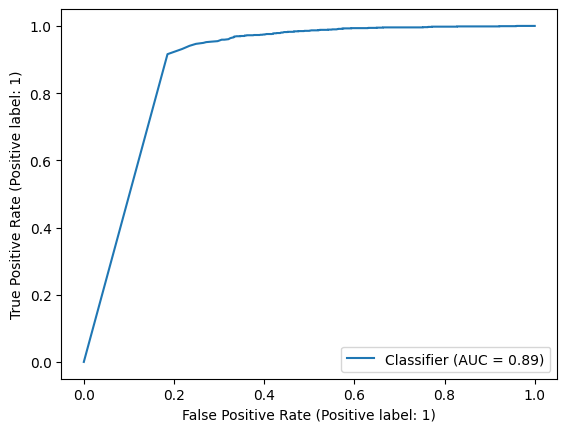

In [63]:
from sklearn.metrics import RocCurveDisplay

display = RocCurveDisplay.from_predictions(y_test.detach().cpu().numpy(), probas.detach().cpu().numpy())

In [82]:
roc_auc_score(y_test.detach().cpu().numpy()[:10], probas.detach().cpu().numpy()[:10])

0.875

In [76]:
y_test.detach().cpu().numpy()[:10]

array([1., 0., 0., 0., 0., 1., 0., 0., 0., 0.], dtype=float32)

In [77]:
probas.detach().cpu().numpy()[:10]

array([1.        , 0.99999905, 0.9999943 , 1.        , 0.95781446,
       1.        , 0.9999007 , 0.9999995 , 0.9985538 , 1.        ],
      dtype=float32)

In [91]:
roc_auc_score([1., 0., 0., 0., 0., 1., 0., 0., 0., 0.], [1.        , 0.99999905, 0.9999943 , 1.        , 0.95781446,
       1.        , 0.9999007 , 1 , 1 , 1.        ])

0.75

In [92]:
roc_auc_score([1., 0., 0., 0., 0., 1., 0., 0., 0., 0.], [1.        , 0.99999905, 0.9999943 , 1.        , 0.95781446,
       1.        , 0.9999007 , 0.998 , 0.9999 , 0.999])

0.9375

In [58]:
N = 1331
roc_auc_score([0]*N + [1]*N, (1/3 * np.random.rand(158)).tolist() + [1]*2504)


0.5593538692712247

In [41]:
px.histogram(y_test.detach().cpu().numpy())

### hyperparameter sweep for the actual probe

In [160]:
from probes import LRProbe
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
from sklearn.linear_model import LogisticRegression

# Combine memmed and non_memmed hidden states
np_mem = mem_hidden_states.cpu().float()[:unmem_hidden_states.shape[0]]
np_unmem = unmem_hidden_states.cpu().float()

LAYER = 34
TOK_IDXS = [5, 6, 7, 8, 9]

In [162]:
X = torch.cat([np_mem[:, LAYER, tok_idx, :] for tok_idx in TOK_IDXS] +  [np_unmem[:, LAYER, tok_idx, :] for tok_idx in TOK_IDXS])
y = torch.cat([torch.ones(np_mem.shape[0]) for _ in TOK_IDXS] + [torch.zeros(np_unmem.shape[0]) for _ in TOK_IDXS])

In [165]:
X_train, X_test, y_train, y_test = train_test_split(X.numpy(), y.numpy(), test_size=0.40, random_state=42)

#Pytorch code
X_train = torch.from_numpy(X_train)
y_train = torch.from_numpy(y_train)
X_test = torch.from_numpy(X_test)
y_test = torch.from_numpy(y_test)


In [ ]:
lr = 0.001
weight_decay = 0.1
epochs = 1000
use_bias = False
normalize = True

if normalize:
    X_train = (X_train - X_train.mean(dim = 0)) / X_train.std(dim = 0)
    X_test = (X_test - X_train.mean(dim = 0)) / X_train.std(dim = 0)

probe = LRProbe.from_data(X_train, y_train, 
                          lr = lr, 
                          weight_decay = weight_decay, 
                          epochs = epochs, 
                          use_bias = use_bias,
                          device = "cuda", )

probes[layer][tok_idx] = probe
probe_accs[layer][tok_idx] = LRProbe.get_probe_accuracy(probe, X_test, y_test, device = "cuda")
probe_aucs[layer][tok_idx] = LRProbe.get_probe_auc(probe, X_test, y_test, device = "cuda")

print(f"PROBE LAYER {layer} TOKEN {tok_idx}")
print(f"Accuracy {probe_accs[layer][tok_idx]}")
print(f"AUC {probe_aucs[layer][tok_idx]}")
print()



In [166]:
# Define the ranges for hyperparameters
lr_range = [0.0001, 0.01]
weight_decay_range = [0.01, 0.5]
epochs_range = [500, 2000]
use_bias_range = [True, False]
normalize_range = [True, False]

N_ITER = 10
probes = []
configs = []
accs = []
aucs = []
for i in range(N_ITER):
    # Randomly sample hyperparameters
    lr = random.uniform(lr_range[0], lr_range[1])
    weight_decay = random.uniform(weight_decay_range[0], weight_decay_range[1])
    epochs = random.randint(epochs_range[0], epochs_range[1])
    use_bias = random.choice(use_bias_range)
    normalize = random.choice(normalize_range)
    config = {"lr": lr, "weight_decay": weight_decay, "epochs": epochs, "use_bias": use_bias, "normalize": normalize}
    
    if normalize:
        X_train = (X_train - X_train.mean(dim=0)) / X_train.std(dim=0)
        X_test = (X_test - X_train.mean(dim=0)) / X_train.std(dim=0)

    probe = LRProbe.from_data(X_train, y_train,
                            lr=lr,
                            weight_decay=weight_decay,
                            epochs=epochs,
                            use_bias=use_bias,
                            device="cuda")

    probes.append(probe)
    configs.append(config)
    accs.append(probe.get_probe_accuracy(X_test, y_test, device="cuda"))
    aucs.append(probe.get_probe_auc( X_test, y_test, device="cuda"))

    print(f"Config: {config}")
    print(f"Accuracy {accs[i]}")
    print(f"AUC {aucs[i]}")
    print()


Config: {'lr': 0.004883170604302022, 'weight_decay': 0.2724887350919976, 'epochs': 979, 'use_bias': True, 'normalize': False}
Accuracy 0.9397420883178711
AUC 0.9805075334106531

Config: {'lr': 0.007992431002385114, 'weight_decay': 0.3448201842631193, 'epochs': 1045, 'use_bias': False, 'normalize': False}
Accuracy 0.9395938515663147
AUC 0.9804930194599009

Config: {'lr': 0.008263075645807675, 'weight_decay': 0.21474674477973768, 'epochs': 1230, 'use_bias': True, 'normalize': False}
Accuracy 0.9401867985725403
AUC 0.9809970413954137

Config: {'lr': 0.005356350052413445, 'weight_decay': 0.2761131946808724, 'epochs': 848, 'use_bias': True, 'normalize': False}
Accuracy 0.9393715262413025
AUC 0.9808717445790779

Config: {'lr': 0.00936680147211404, 'weight_decay': 0.4224008964532628, 'epochs': 1039, 'use_bias': False, 'normalize': True}
Accuracy 0.9400385618209839
AUC 0.9695799678034207

Config: {'lr': 0.00202345060408634, 'weight_decay': 0.01691401246942814, 'epochs': 1916, 'use_bias': True,

In [167]:
best_acc_idx = accs.index(max(accs))
configs[best_acc_idx]


{'lr': 0.009108819332552417,
 'weight_decay': 0.33731214601774157,
 'epochs': 1533,
 'use_bias': True,
 'normalize': True}

## Random

In [191]:
duplicated_data = mem_12b_data[mem_12b_data.duplicated(subset='ground', keep=False)]
duplicated_data.to_csv("dupes_according_to_ground.csv", index = False)

In [198]:
mem_12b_data.loc[8847:8849]

,gen,ground,mem_status,source,idx_in_ground,idx_in_hidden_states,char_by_char_similarity
8847,"<?xml version=""1.0"" encoding=""UTF-8""?>\n<proje...","<?xml version=""1.0"" encoding=""UTF-8""?>\n<proje...",0.578125,pile,3888,3859,0.903846
8848,New Zune 2 Flash-Based Players Confirmed\n\nBy...,New Zune 2 Flash-Based Players Confirmed\n\nBy...,0.500000,pile,3889,3860,0.495690
8849,VIDEO: Eamonn Dowd Departure Lounge\n\nTwo art...,VIDEO: Eamonn Dowd Departure Lounge\n\nTwo art...,0.500000,pile,3890,3861,0.488789
